## **Camera Calibration Pipeline**

This project is designed to calibrate a single camera using a calibration board, and it’s structured into four primary stages: image collection, calibration processing, reprojection error analysis, and result visualization.
This project is originally done on Google Colab. 

In [3]:
#mounting the google drive
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Importing necessary libraries
import cv2
import numpy as np
import glob
from matplotlib import pyplot as plt

# Setup size for the chessboard for detection
CHECKERBOARD_SIZE = (8, 5)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Creating vector to store vectors of 3D points for each checkerboard image
objpoints = []
# Creating vector to store vectors of 2D points for each checkerboard image
imgpoints = []

# Defining the world coordinates for 3D points
objp = np.zeros((CHECKERBOARD_SIZE[0]*CHECKERBOARD_SIZE[1], 3), np.float32)
objp[:, :2] = np.mgrid[0:CHECKERBOARD_SIZE[0], 0:CHECKERBOARD_SIZE[1]].T.reshape(-1, 2)
prev_img_shape = None

# Iterate over each image to find chessboard corners
images = glob.glob('/content/drive/MyDrive/ENPM673/project3/Problem1_images/*.jpg')
print("Found", len(images), "images")

# Counter to keep track of the number of images with detected corners
display_counter = 0

for fname in images:
    # Read the image
    img = cv2.imread(fname)
    if img is None:
        print(f"Failed to load the image {fname}")
        continue
    # converting the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # detecting the corners of a chessboard pattern using adaptive thresholding, fast checking, and image normalization
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD_SIZE, cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_FAST_CHECK + cv2.CALIB_CB_NORMALIZE_IMAGE)

    """
    If the desired number of corners are detected, the pixel coordinates are refined and displayed
    on the images of checker board
    """
    if ret:
        objpoints.append(objp)
        corners2 = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
        imgpoints.append(corners2)

        # Increment counter
        display_counter += 1

        # Draw and display the corners for every 5th image
        if display_counter % 5 == 0:
            cv2.drawChessboardCorners(img, CHECKERBOARD_SIZE, corners2, ret)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title(f'Chessboard Corners Detected in {fname.split("/")[-1]}')
            plt.show()

        # Reset counter if it reaches 5
        if display_counter == 5:
            display_countercounter = 0

h,w = img.shape[:2]
"""
Performing camera calibration by passing the values of known 3D points (objpoints)
and corresponding pixel coordinates of the detected corners (imgpoints)
"""
if len(objpoints) > 0 and len(imgpoints) > 0:
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    print("Calibration successful")
    print("Camera matrix:\n", mtx)
else:
    print("Calibration failed: There were no corners detected in the image")


In the above code cell, we import necessary libraries for image proecssing **(OpenCV, Numpy)** , file handling, virtualization **(glob, Matplotlib)**. we setup the chekboard board dimensions so we can detect the corners of the checkerboard.  We initialzie lists to store 3D world coordinates of the checkerboard(_objpoints_) and their corresponding 2D image coordinates (_imgpoints_).

We generate 3D world coordinates of the checkerboard corners. Here, a grid of points is created with the known dimensions of the checkerboard. Then we iterate over each image of the checkerboard, convert it to grayscale and use inbuilt OpenCV functions to find the chess corners. We add additional criteria(_flags_) for corner detection. These include **adaptive thresholding algorithm for conrer detection, fast check flag for performing a fast check** to quickly reject images that do not contain the chessboard pattern and normalize image flag to normalize he image before applying the corner detection algorithm. The resulting coordinates are stored in an numpy array.

If we find the desired number of corners, we refine the pixel coordinates using  **'cv2.cornerSubPix'** to improve accuracy of corner localization. We display every 5th iamge in which we find the corners. After detecting corners in all images, we perform camera calibration using the **'cv2.calibrateCamera'**. We pass the _objpoints_ and _imgpoints_ lists along with the shape of the grayscale image. This function estimates the **camera intrinsic matrix** (_mtx_), **distortion coefficients** (_dist_), **rotation vectors** (_rvecs_), and **translation vectors** (_tvecs_) using a **least-squares optimization algorithm**.

If corners are successfully detected, we print the calibration matrix and 5 images with detected corners.


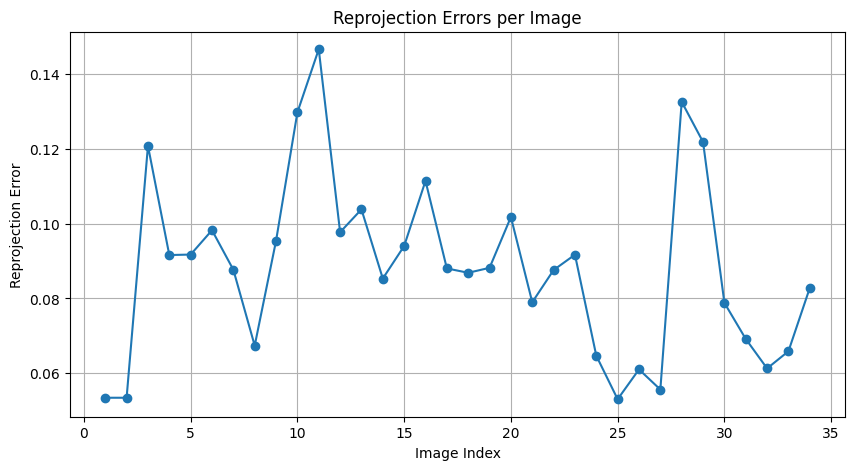

Mean reprojection error: 0.08818509010053775


In [6]:
#  Calculating and plotting the reprojection errors
reproj_errors = []

# Iterate over each image and calculate reprojection error
for i in range(len(objpoints)):
    # Project 3D object points onto the image plane using the estimated camera parameters
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)

    # Calculate the reprojection error by comparing the projected points with the detected points
    error = cv2.norm(imgpoints[i], imgpoints2, cv2.NORM_L2) / len(imgpoints2)
    reproj_errors.append(error)

# Plot the reprojection errors
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(reproj_errors) + 1), reproj_errors, marker='o')
plt.title('Reprojection Error per Image')
plt.xlabel('Image Number')
plt.ylabel('Reprojection Error')
plt.grid(True)
plt.show()

# Calculate mean reprojection error
mean_reproj_error = sum(reproj_errors) / len(reproj_errors)
print("Mean reprojection error:", mean_reproj_error)

In the above code cell, we iterate over each image's 3D points (_objpoints_) and their corresponding 2D points (_imgpoints_). For each image, the 3D object points (objpoints) are projected onto the image plane using the estimated camera parameters (_rvecs, tvecs, mtx, dist_) with the **'cv2.projectPoints'** function.

The reprojection error is calculated by comparing the projected image points (_imgpoints2_) with the detected image points (_imgpoints_) using the Euclidean norm (_L2 norm_). The reprojection error is normalized by dividing it by the number of image points (_len(imgpoints2)_) to obtain an average error per point. We plot the error for each image.

The reprojection error is a crucial metric in camera calibration that quantifies the accuracy of the estimated camera parameters. It measures the disparity between the observed image points (detected corners) and their corresponding projected image points (reprojected from known 3D world) using the calibrated camera parameters. This provides a quantative measure of how well the estimated camera parameters fit the observed image data. A low reprojection error indicates a close alignment between the observed and projected image points, suggesting high calibration accuracy.

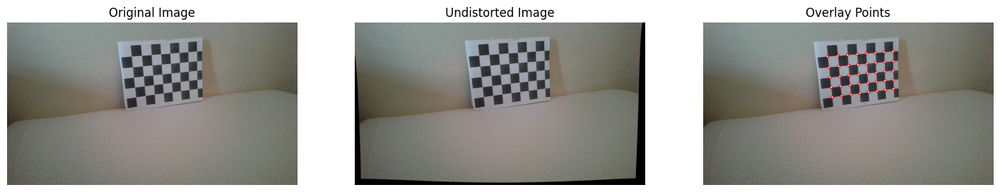

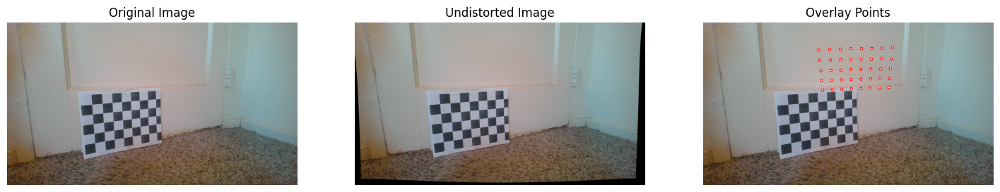

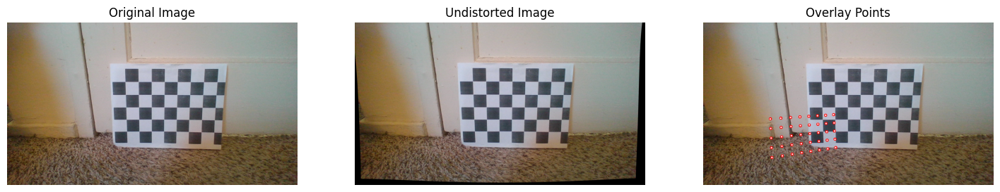

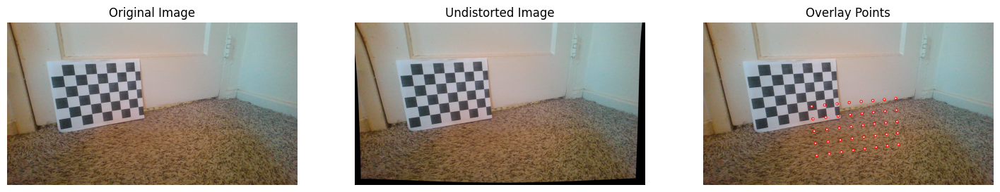

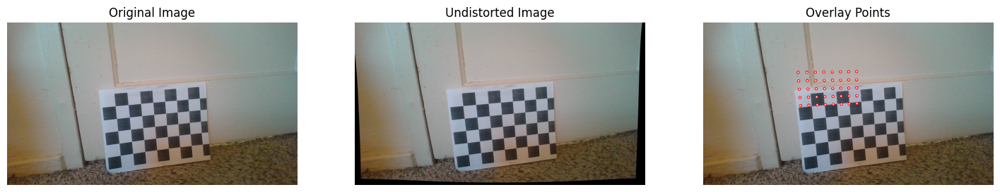

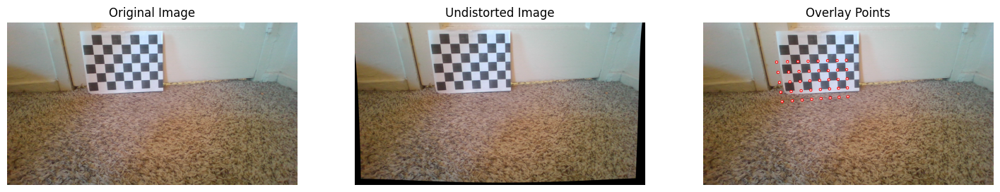

In [15]:
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    # Check if the image could not be read or if the index exceeds the length of the calibration data
    if img is None or i >= len(imgpoints) or i >= len(rvecs) or i >= len(tvecs):
        continue

    # Undistort the image using the camera matrix (mtx) and distortion coefficients (dist)
    # newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))
    undistorted_image = cv2.undistort(img, mtx, dist, None, mtx)
    overlay_image = img.copy()

    # Project the 3D object points onto the image plane using the estimated camera parameters
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)

    # Overlay detected and reprojected points on the image
    for original, projected in zip(imgpoints[i], imgpoints2):
        orig_point = tuple(int(val) for val in original.ravel())
        proj_point = tuple(int(val) for val in projected.ravel())

        # Check for NaN values in the points
        if np.isnan(orig_point).any() or np.isnan(proj_point).any():
            continue

        # Draw circles at the original and reprojected points on the overlay image
        cv2.circle(overlay_image, orig_point, 10, (0,0,255), -1)  #red for original
        cv2.circle(overlay_image, proj_point, 5, (255,255,255), -1)  # white for reprojected

    # Display the images
    if (i + 1) % 5 == 0:  # Display every 5th image
        fig, ax = plt.subplots(1, 3, figsize=(18, 6))

        # Display the original image
        ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax[0].set_title('Original Image')
        ax[0].axis('off')

        # Display the undistorted image
        ax[1].imshow(cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2RGB))
        ax[1].set_title('Undistorted Image')
        ax[1].axis('off')

        # Display the overlay image with detected and reprojected points
        ax[2].imshow(cv2.cvtColor(overlay_image, cv2.COLOR_BGR2RGB))
        ax[2].set_title('Overlay Points')
        ax[2].axis('off')

        plt.show()


In the above code cell, we iterate over image and apply **'cv2.undistort'** function using camera matrix and distortion coefficients obtained from camera calibration. The function is used to correct the distortion introduced by the camera's lens. The next step is to overlay the detected and reprojected points on a copy of the original image. Detected points are shown in red, and reprojected points are shown in white. Then Displaying every 5th image with detected corners, corresponding original iamge and undistorted image.

# **Stereo Vision System**

**Prerequisite: You need to make a folder called "Problem2_outputs" to save all the output images.**

In [21]:
# Importing necessary libraries
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Function to perform feature matching between two images using SIFT
def feature_matching(image1, image2):
    # Create SIFT detector
    detector = cv2.SIFT_create()
    # Detect keypoints and compute descriptors for each image
    keypoints1, descriptors1 = detector.detectAndCompute(image1, None)
    keypoints2, descriptors2 = detector.detectAndCompute(image2, None)
    
    # Match descriptors between the two images
    matcher = cv2.FlannBasedMatcher_create()
    matches = matcher.knnMatch(descriptors1, descriptors2, k=2)

    # Filter good matches using ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.25 * n.distance:
            good_matches.append(m)

    # Extract source and destination points from good matches
    src_pts = np.float32([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    return src_pts, dst_pts

# Function to estimate the Fundamental matrix using RANSAC
def estimate_F(src_pts, dst_pts):
    F, mask = cv2.findFundamentalMat(src_pts, dst_pts, cv2.FM_RANSAC, 0.1, 0.99)
    return F

# Function to compute the Essential matrix from the Fundamental matrix and calibration matrices
def compute_E(F, K1, K2):
    E = np.dot(np.dot(K2.T, F), K1)
    return E

# Function to decompose the Essential matrix into rotation and translation matrices
def decompose_E(E, src_pts, dst_pts):
    _, R, t, _ = cv2.recoverPose(E, src_pts, dst_pts)
    return R, t

# Function to rectify images to ensure horizontal epipolar lines
def rectify_images(image1, image2, src_pts, dst_pts, K1, K2, F):
    _, H1, H2 = cv2.stereoRectifyUncalibrated(src_pts, dst_pts, F, (width, height))
    print("Homography Matrix H1:")
    print(H1)
    print("Homography Matrix H2:")
    print(H2)
    # Rectify the images using computed homography matrices
    image1_rectified = cv2.warpPerspective(image1, H1, (width, height))
    image2_rectified = cv2.warpPerspective(image2, H2, (width, height))
    return image1_rectified, image2_rectified, H1, H2

# Function to update calibration matrices for rectified images
def update_calibration_matrices(K1, K2, H1, H2):
    K1_rectified = np.dot(np.linalg.inv(H1), K1)
    K2_rectified = np.dot(np.linalg.inv(H2), K2)
    return K1_rectified, K2_rectified


# Function to update feature points after rectification
def update_feature_points(src_pts, dst_pts, H1, H2):
    src_pts_rectified = cv2.perspectiveTransform(src_pts, H1)
    dst_pts_rectified = cv2.perspectiveTransform(dst_pts, H2)
    return src_pts_rectified, dst_pts_rectified

# Function to decompose Essential matrix using rectified points
def decompose_E_rectified(E, src_pts_rectified, dst_pts_rectified):
    _, R, t, _ = cv2.recoverPose(E, src_pts_rectified, dst_pts_rectified)
    return R, t

# Function to visualize epipolar lines and feature points on rectified images
def visualize_epipolar_lines(image1_rectified, image2_rectified, src_pts_rectified, dst_pts_rectified, width):
    # Convert rectified images to color for visualization
    image1_with_points = cv2.cvtColor(image1_rectified, cv2.COLOR_GRAY2BGR)
    image2_with_points = cv2.cvtColor(image2_rectified, cv2.COLOR_GRAY2BGR)

    # Draw circles on feature points and epipolar lines on images
    for pt in src_pts_rectified:
        pt_int = (int(pt[0][0]), int(pt[0][1]))  # Convert to integer format
        cv2.circle(image1_with_points, pt_int, 5, (0, 255, 0), -1)
    for pt in dst_pts_rectified:
        pt_int = (int(pt[0][0]), int(pt[0][1]))  # Convert to integer format
        cv2.circle(image2_with_points, pt_int, 5, (0, 255, 0), -1)

    lines2 = cv2.computeCorrespondEpilines(dst_pts_rectified.reshape(-1, 1, 2), 2, F)
    lines2 = lines2.reshape(-1, 3)
    for r, pt1, pt2 in zip(lines2, src_pts_rectified, dst_pts_rectified):
        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = map(int, [0, -r[2] / r[1]])
        x1, y1 = map(int, [width, -(r[2] + r[0] * width) / r[1]])
        image1_with_points = cv2.line(image1_with_points, (x0, y0), (x1, y1), color, 1)
        image1_with_points = cv2.circle(image1_with_points, (int(pt1[0][0]), int(pt1[0][1])), 5, color, -1)
        image2_with_points = cv2.line(image2_with_points, (x0, y0), (x1, y1), color, 1)
        image2_with_points = cv2.circle(image2_with_points, (int(pt2[0][0]), int(pt2[0][1])), 5, color, -1)

    return image1_with_points, image2_with_points



In the above snippet, necessary libraries are imported for image processing. The goal is to design and implement a stereo vision system. Firstly, we identify matching features between the two images in each dataset. Here we use SIFT algorithm. We start by detecting keypoints and computing descriptors for each input image using the Scale-Invariant Feature Transform (SIFT) algorithm. It then matches descriptors between the two images using a Flann-based matcher and filters good matches using a ratio test.

Next, we estimate the Fundamental matrix (F) using the RANSAC algorithm based on the matched keypoints. The Essential matrix (E) is computed from the Fundamental matrix (F) and the calibration matrices (K1 and K2) of the two cameras. The Essential matrix (E) is decomposed into rotation (R) and translation (t) matrices. Then the images are rectified to ensure horizontal epipolar lines. This is achieved by computing the homography matrices (H1 and H2) using 'stereoRectifyUncalibrated' and then applying them to warp the images.
After that, The calibration matrices for the rectified images are updated based on the rectification homography matrices.

The feature points are updated after rectification by applying the perspective transformation using the rectification homography matrices. Then the rectified Essential matrix (E) is decomposed into rotation (R) and translation (t) matrices using the 'recoverPose' function. Finally, Epipolar lines and feature points are visualized on the rectified images. Epipolar lines are computed using the 'computeCorrespondEpilines' function, and then drawn on the images along with the corresponding feature points.

Homography Matrix H1:
[[-2.08480790e-01  2.74980455e-02  1.17949083e+01]
 [-3.70797098e-03 -2.06731403e-01  4.48818746e+00]
 [-1.56380457e-06 -1.06305076e-07 -2.05207698e-01]]
Homography Matrix H2:
[[ 1.00463558e+00 -1.51097061e-02  3.70908899e+00]
 [ 1.77094058e-02  9.99846745e-01 -1.69182718e+01]
 [ 4.94651743e-06 -7.43955582e-08  9.95291517e-01]]


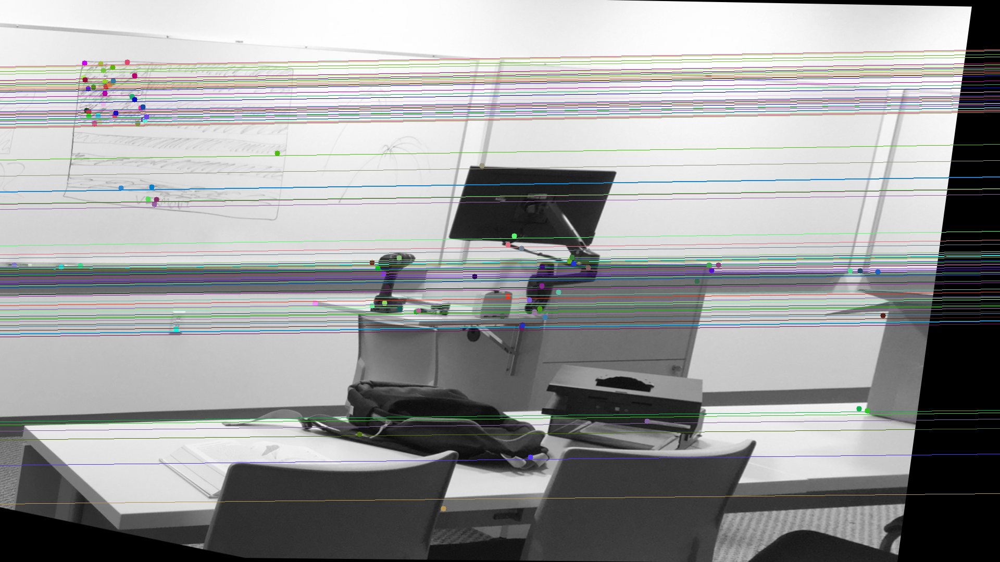

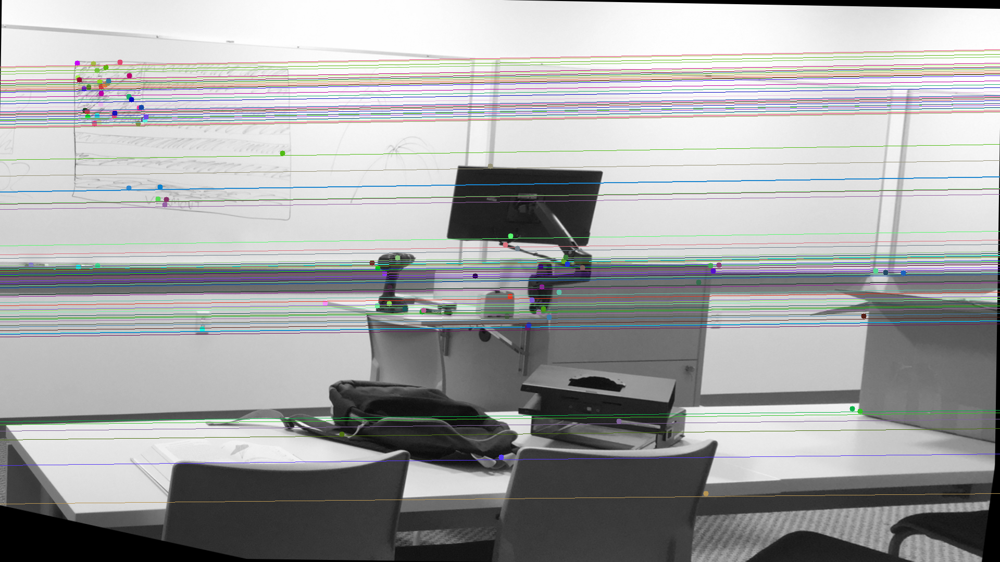

In [22]:
# Load images (dataset1)
image1 = cv2.imread('Dataset/classroom/im0.png', 0)
image2 = cv2.imread('Dataset/classroom/im1.png', 0)

#calibration parameters for first dataset, the parameters are different for different datasets.
focal_length = 1746.24  #storageroom:(1742.11), #traproom(1769.02)
principal_point = (14.88, 534.11) #storageroom:(804.90,541.22), #traproom(1271.89,527.17)
baseline = 678.37 #storageroom(221.76), #traproom(295.44)
width = 1920
height = 1080
ndisp=310 #storageroom(100), #traproom(140)
vmin=60  #storageroom(29), #traproom(25)
vmax=280  #(61), #traproom(118)

# Define calibration matrices
K1 = np.array([[focal_length, 0, principal_point[0]],
               [0, focal_length, principal_point[1]],
               [0, 0, 1]])

K2 = np.array([[focal_length, 0, principal_point[0]],
               [0, focal_length, principal_point[1]],
               [0, 0, 1]])

# Perform feature matching between the images
src_pts, dst_pts = feature_matching(image1, image2)

# Estimate the Fundamental matrix
F = estimate_F(src_pts, dst_pts)

# Compute the Essential matrix
E = compute_E(F, K1, K2)

# Decompose the Essential matrix into rotation and translation matrices
R, t = decompose_E(E, src_pts, dst_pts)

# Rectify the images
image1_rectified, image2_rectified, H1, H2 = rectify_images(image1, image2, src_pts, dst_pts, K1, K2, F)

# Update calibration matrices for rectified images
K1_rectified, K2_rectified = update_calibration_matrices(K1, K2, H1, H2)

# Update feature points after rectification
src_pts_rectified, dst_pts_rectified = update_feature_points(src_pts, dst_pts, H1, H2)

# Decompose Essential matrix using rectified points
R_rectified, t_rectified = decompose_E_rectified(E, src_pts_rectified, dst_pts_rectified)

# Visualize epipolar lines and feature points on rectified images
image1_with_points, image2_with_points = visualize_epipolar_lines(image1_rectified, image2_rectified, src_pts_rectified, dst_pts_rectified, width)


# Specify the directory to save the all the images
save_dir = 'Dataset/Stereo_Vision+System'

# Save images with epipolar lines
cv2.imwrite(save_dir + 'image1_epilines_classroom.png', image1_with_points)
cv2.imwrite(save_dir + 'image2_epilines_classroom.png', image2_with_points)

# Display images
cv2_imshow(image1_with_points)
cv2_imshow(image2_with_points)

cv2.waitKey(0)
cv2.destroyAllWindows()

In the above code cell, we load the imges from the first dataset, The the calbration parameters are hardcorded and will be updated in due time.

We call all the functions of the stereo vision system pipeline and the output is the epipolar lines on the rectified image. The images are saved in folder "Problem2_outputs".

**NOTE: "You have to create this folder"**

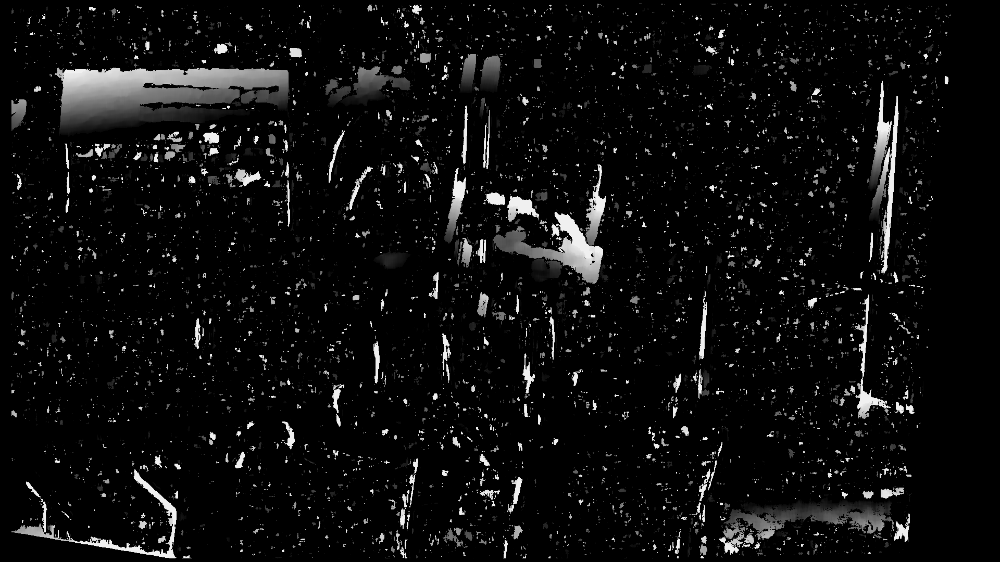

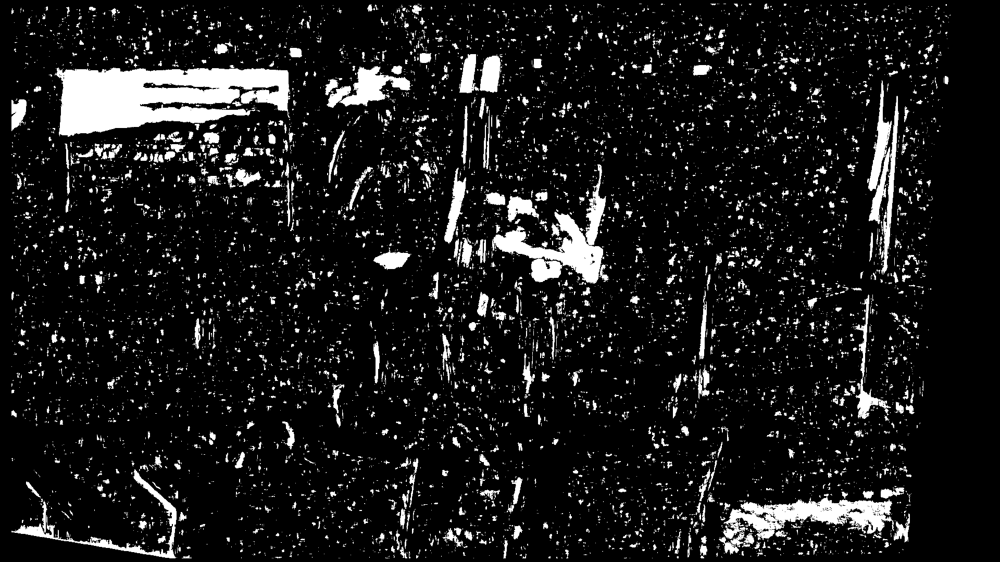

In [20]:
save_dir = 'Dataset/Stereo_Vision_System'

# Calculate the disparity map using StereoBM algorithm
def calculate_disparity_map(image1_rectified, image2_rectified):
    stereo = cv2.StereoBM_create(numDisparities=16, blockSize=15)
    # Compute the disparity map using rectified images
    disparity = stereo.compute(image1_rectified, image2_rectified)
    return disparity

# Rescale the disparity map and save it as grayscale and color images
def save_disparity_map(disparity_map, filename):
   # Rescale the disparity map to 8-bit grayscale
    disparity_map_rescaled = cv2.normalize(disparity_map, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    cv2.imwrite(save_dir + filename + "_grayscale_classroom.png", disparity_map_rescaled)
    # Apply a color map to the rescaled disparity map
    heatmap = cv2.applyColorMap(disparity_map_rescaled, cv2.COLORMAP_JET)
    cv2.imwrite(save_dir + filename + "_color_classroom.png", heatmap)

# Call functions to calculate and save the disparity map
disparity_map = calculate_disparity_map(image1_rectified, image2_rectified)
save_disparity_map(disparity_map, "disparity_map")

# Compute depth values from the disparity map
def compute_depth_map(disparity_map, baseline, focal_length):
    depth_map = np.zeros_like(disparity_map, dtype=np.float32)
    # Calculate depth values using the formula: depth = baseline * focal_length / disparity
    depth_map[disparity_map != 0] = baseline * focal_length / disparity_map[disparity_map != 0]
    return depth_map

# Generate depth image and save it as grayscale and color images
def save_depth_map(depth_map, filename):
   # Rescale the depth map to 8-bit grayscale
    depth_map_rescaled = cv2.normalize(depth_map, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    cv2.imwrite(save_dir +filename + "_depth_grayscale_classroom.png", depth_map_rescaled)
    # Apply a color map to the rescaled depth map
    heatmap = cv2.applyColorMap(depth_map_rescaled, cv2.COLORMAP_JET)
    cv2.imwrite(save_dir + filename + "_depth_color_classroom.png", heatmap)

# Call functions to compute and save the depth map
depth_map = compute_depth_map(disparity_map, baseline, focal_length)
save_depth_map(depth_map, "depth_map")


# cv2_imshow(disparity_map)
# cv2_imshow(depth_map)


the above cell calculates the disparity map from rectified stereo images and then computes the corresponding depth map. Then we save both the disparity map and the depth map as grayscale and color images in the specified directory. The disparity map is calculated using the 'StereoBM' algorithm, while the depth map is computed using the 'baseline and focal length' parameters. Finally, the disparity and depth maps are saved as images for visualization and further analysis.

### **Output for 2nd Dataset(storageroom)**

Homography Matrix H1:
[[ 3.75373598e-01  3.67253045e-04 -1.13067452e+01]
 [-6.12567350e-03  3.79322058e-01  4.91473005e+00]
 [-3.08055719e-06 -1.09385262e-07  3.81741962e-01]]
Homography Matrix H2:
[[ 9.92266802e-01  1.17943391e-02  1.05492685e+00]
 [-1.61956104e-02  9.99878134e-01  1.56135937e+01]
 [-7.98183729e-06 -9.48741765e-08  1.00771380e+00]]


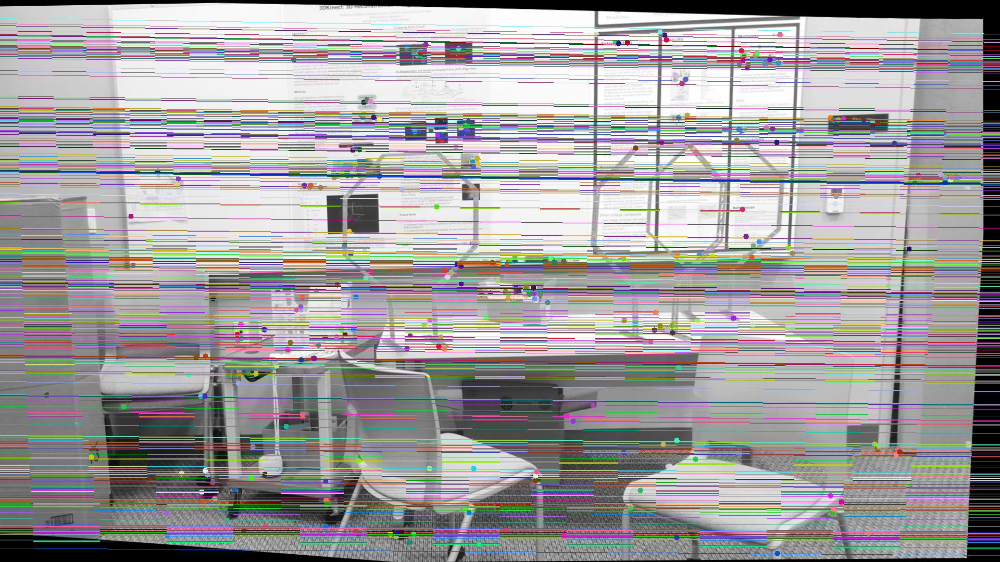

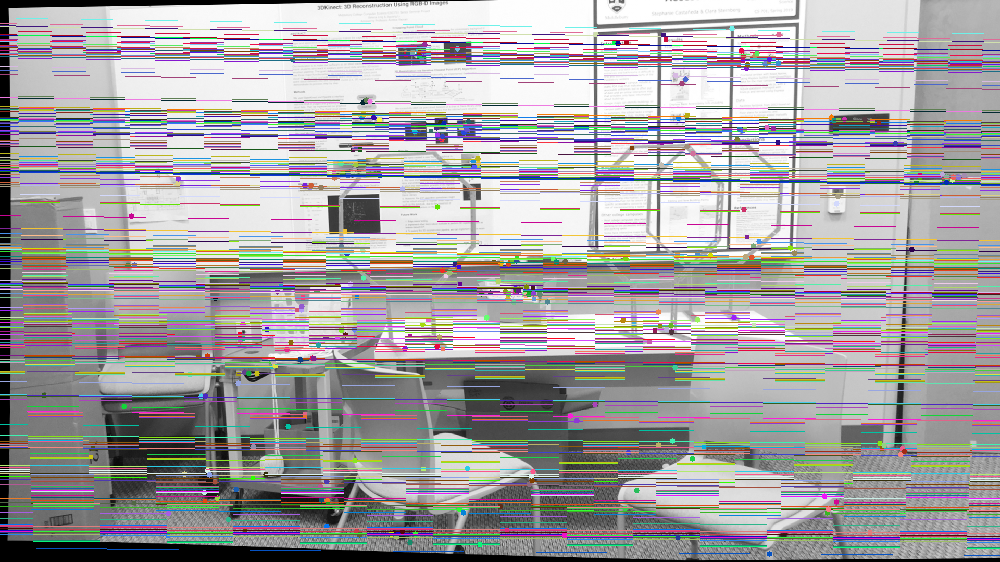

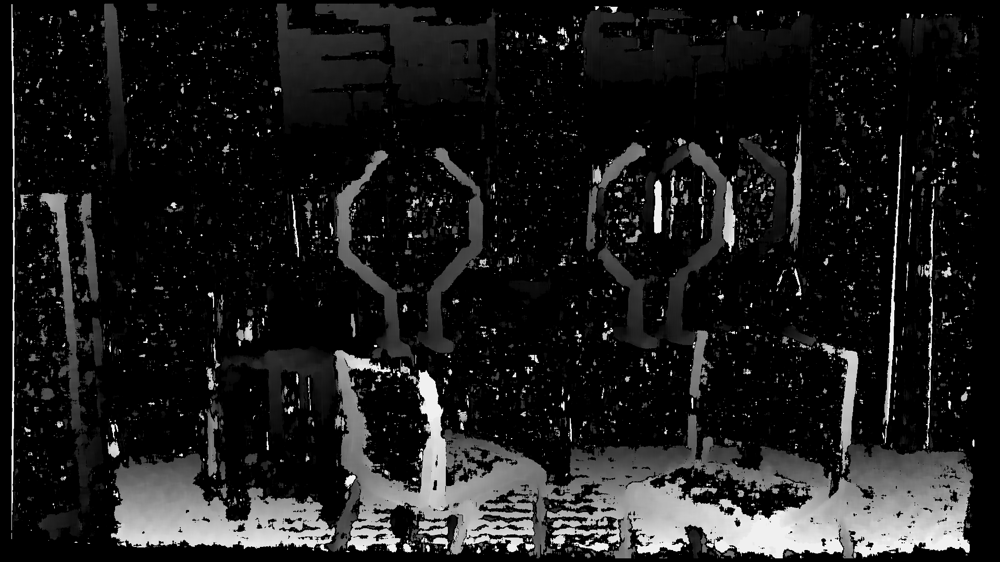

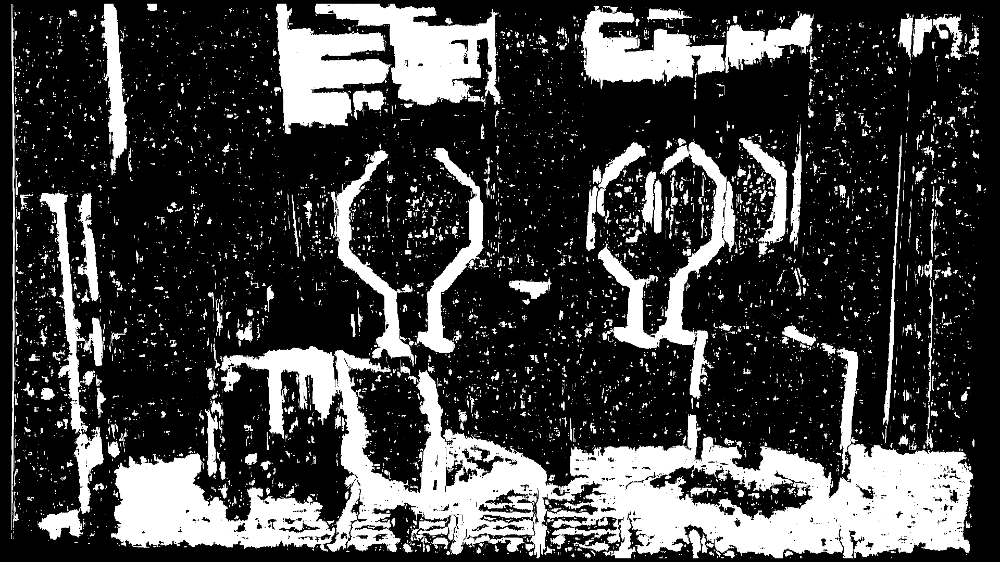

In [24]:
# Importing necessary libraries
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Function to perform feature matching between two images using SIFT
def feature_matching(image1, image2):
    # Create SIFT detector
    detector = cv2.SIFT_create()
    # Detect keypoints and compute descriptors for each image
    keypoints1, descriptors1 = detector.detectAndCompute(image1, None)
    keypoints2, descriptors2 = detector.detectAndCompute(image2, None)
    # Match descriptors between the two images
    matcher = cv2.FlannBasedMatcher_create()
    matches = matcher.knnMatch(descriptors1, descriptors2, k=2)

    # Filter good matches using ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.25 * n.distance:
            good_matches.append(m)

    # Extract source and destination points from good matches
    src_pts = np.float32([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    return src_pts, dst_pts

# Function to estimate the Fundamental matrix using RANSAC
def estimate_F(src_pts, dst_pts):
    F, mask = cv2.findFundamentalMat(src_pts, dst_pts, cv2.FM_RANSAC, 0.1, 0.99)
    return F

# Function to compute the Essential matrix from the Fundamental matrix and calibration matrices
def compute_E(F, K1, K2):
    E = np.dot(np.dot(K2.T, F), K1)
    return E

# Function to decompose the Essential matrix into rotation and translation matrices
def decompose_E(E, src_pts, dst_pts):
    _, R, t, _ = cv2.recoverPose(E, src_pts, dst_pts)
    return R, t

# Function to rectify images to ensure horizontal epipolar lines
def rectify_images(image1, image2, src_pts, dst_pts, K1, K2, F):
    _, H1, H2 = cv2.stereoRectifyUncalibrated(src_pts, dst_pts, F, (width, height))
    print("Homography Matrix H1:")
    print(H1)
    print("Homography Matrix H2:")
    print(H2)
    # Rectify the images using computed homography matrices
    image1_rectified = cv2.warpPerspective(image1, H1, (width, height))
    image2_rectified = cv2.warpPerspective(image2, H2, (width, height))
    return image1_rectified, image2_rectified, H1, H2

# Function to update calibration matrices for rectified images
def update_calibration_matrices(K1, K2, H1, H2):
    K1_rectified = np.dot(np.linalg.inv(H1), K1)
    K2_rectified = np.dot(np.linalg.inv(H2), K2)
    return K1_rectified, K2_rectified


# Function to update feature points after rectification
def update_feature_points(src_pts, dst_pts, H1, H2):
    src_pts_rectified = cv2.perspectiveTransform(src_pts, H1)
    dst_pts_rectified = cv2.perspectiveTransform(dst_pts, H2)
    return src_pts_rectified, dst_pts_rectified

# Function to decompose Essential matrix using rectified points
def decompose_E_rectified(E, src_pts_rectified, dst_pts_rectified):
    _, R, t, _ = cv2.recoverPose(E, src_pts_rectified, dst_pts_rectified)
    return R, t

# Function to visualize epipolar lines and feature points on rectified images
def visualize_epipolar_lines(image1_rectified, image2_rectified, src_pts_rectified, dst_pts_rectified, width):
    # Convert rectified images to color for visualization
    image1_with_points = cv2.cvtColor(image1_rectified, cv2.COLOR_GRAY2BGR)
    image2_with_points = cv2.cvtColor(image2_rectified, cv2.COLOR_GRAY2BGR)

    # Draw circles on feature points and epipolar lines on images
    for pt in src_pts_rectified:
        pt_int = (int(pt[0][0]), int(pt[0][1]))  # Convert to integer format
        cv2.circle(image1_with_points, pt_int, 5, (0, 255, 0), -1)
    for pt in dst_pts_rectified:
        pt_int = (int(pt[0][0]), int(pt[0][1]))  # Convert to integer format
        cv2.circle(image2_with_points, pt_int, 5, (0, 255, 0), -1)

    lines2 = cv2.computeCorrespondEpilines(dst_pts_rectified.reshape(-1, 1, 2), 2, F)
    lines2 = lines2.reshape(-1, 3)
    for r, pt1, pt2 in zip(lines2, src_pts_rectified, dst_pts_rectified):
        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = map(int, [0, -r[2] / r[1]])
        x1, y1 = map(int, [width, -(r[2] + r[0] * width) / r[1]])
        image1_with_points = cv2.line(image1_with_points, (x0, y0), (x1, y1), color, 1)
        image1_with_points = cv2.circle(image1_with_points, (int(pt1[0][0]), int(pt1[0][1])), 5, color, -1)
        image2_with_points = cv2.line(image2_with_points, (x0, y0), (x1, y1), color, 1)
        image2_with_points = cv2.circle(image2_with_points, (int(pt2[0][0]), int(pt2[0][1])), 5, color, -1)

    return image1_with_points, image2_with_points

# Load images (dataset1)
image1 = cv2.imread('Dataset/storageroom/im0.png', 0)
image2 = cv2.imread('Dataset/storageroom/im1.png', 0)

#calibration parameters for first dataset, the parameters are different for different datasets.
focal_length = 1742.11
principal_point = (804.90,541.22)
baseline = 221.76
width = 1920
height = 1080
ndisp=100
vmin=29
vmax=61

# Define calibration matrices
K1 = np.array([[focal_length, 0, principal_point[0]],
               [0, focal_length, principal_point[1]],
               [0, 0, 1]])

K2 = np.array([[focal_length, 0, principal_point[0]],
               [0, focal_length, principal_point[1]],
               [0, 0, 1]])

# Perform feature matching between the images
src_pts, dst_pts = feature_matching(image1, image2)

# Estimate the Fundamental matrix
F = estimate_F(src_pts, dst_pts)

# Compute the Essential matrix
E = compute_E(F, K1, K2)

# Decompose the Essential matrix into rotation and translation matrices
R, t = decompose_E(E, src_pts, dst_pts)

# Rectify the images
image1_rectified, image2_rectified, H1, H2 = rectify_images(image1, image2, src_pts, dst_pts, K1, K2, F)

# Update calibration matrices for rectified images
K1_rectified, K2_rectified = update_calibration_matrices(K1, K2, H1, H2)

# Update feature points after rectification
src_pts_rectified, dst_pts_rectified = update_feature_points(src_pts, dst_pts, H1, H2)

# Decompose Essential matrix using rectified points
R_rectified, t_rectified = decompose_E_rectified(E, src_pts_rectified, dst_pts_rectified)

# Visualize epipolar lines and feature points on rectified images
image1_with_points, image2_with_points = visualize_epipolar_lines(image1_rectified, image2_rectified, src_pts_rectified, dst_pts_rectified, width)


# Specify the directory to save the all the images
save_dir = 'Dataset/Stereo_Vision_System'

# Save images with epipolar lines
cv2.imwrite(save_dir + 'image1_epilines_storageroom.png', image1_with_points)
cv2.imwrite(save_dir + 'image2_epilines_storageroom.png', image2_with_points)

# Display images
cv2_imshow(image1_with_points)
cv2_imshow(image2_with_points)

# Step 11: Calculate the disparity map
def calculate_disparity_map(image1_rectified, image2_rectified):
    stereo = cv2.StereoBM_create(numDisparities=16, blockSize=15)
    disparity = stereo.compute(image1_rectified, image2_rectified)
    return disparity

# Step 12: Rescale the disparity map and save it as grayscale and color images
def save_disparity_map(disparity_map, filename):
    disparity_map_rescaled = cv2.normalize(disparity_map, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    cv2.imwrite(save_dir + filename + "_grayscale_storageroom.png", disparity_map_rescaled)
    heatmap = cv2.applyColorMap(disparity_map_rescaled, cv2.COLORMAP_JET)
    cv2.imwrite(save_dir + filename + "_color_storageroom.png", heatmap)

# Step 13: Call functions to calculate and save the disparity map
disparity_map = calculate_disparity_map(image1_rectified, image2_rectified)
save_disparity_map(disparity_map, "disparity_map")

# Step 14: Compute depth values from the disparity map
def compute_depth_map(disparity_map, baseline, focal_length):
    depth_map = np.zeros_like(disparity_map, dtype=np.float32)
    depth_map[disparity_map != 0] = baseline * focal_length / disparity_map[disparity_map != 0]
    return depth_map

# Step 15: Generate depth image and save it as grayscale and color images
def save_depth_map(depth_map, filename):
    depth_map_rescaled = cv2.normalize(depth_map, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    cv2.imwrite(save_dir +filename + "_depth_grayscale_storageroom.png", depth_map_rescaled)
    heatmap = cv2.applyColorMap(depth_map_rescaled, cv2.COLORMAP_JET)
    cv2.imwrite(save_dir + filename + "_depth_color_storageroom.png", heatmap)

# Step 16: Call functions to compute and save the depth map
depth_map = compute_depth_map(disparity_map, baseline, focal_length)
save_depth_map(depth_map, "depth_map")


cv2_imshow(disparity_map)
cv2_imshow(depth_map)


### **Output for 3rd Dataset(traproom)**

Homography Matrix H1:
[[-8.93012164e-01  2.39573387e-02  6.44507291e+00]
 [ 6.54898548e-03 -9.28553090e-01 -8.73041661e+00]
 [ 9.38488579e-06  2.05266211e-06 -9.41053134e-01]]
Homography Matrix H2:
[[ 9.87926469e-01  1.83935330e-03  1.05973389e+01]
 [-8.65221516e-03  9.99985624e-01  8.31388947e+00]
 [-1.25747893e-05 -2.34121474e-08  1.01208444e+00]]


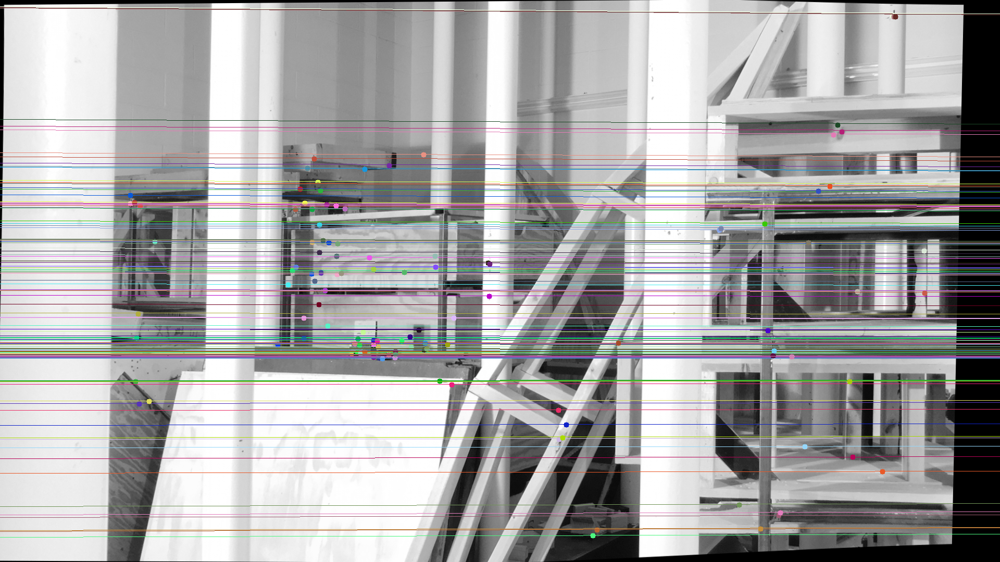

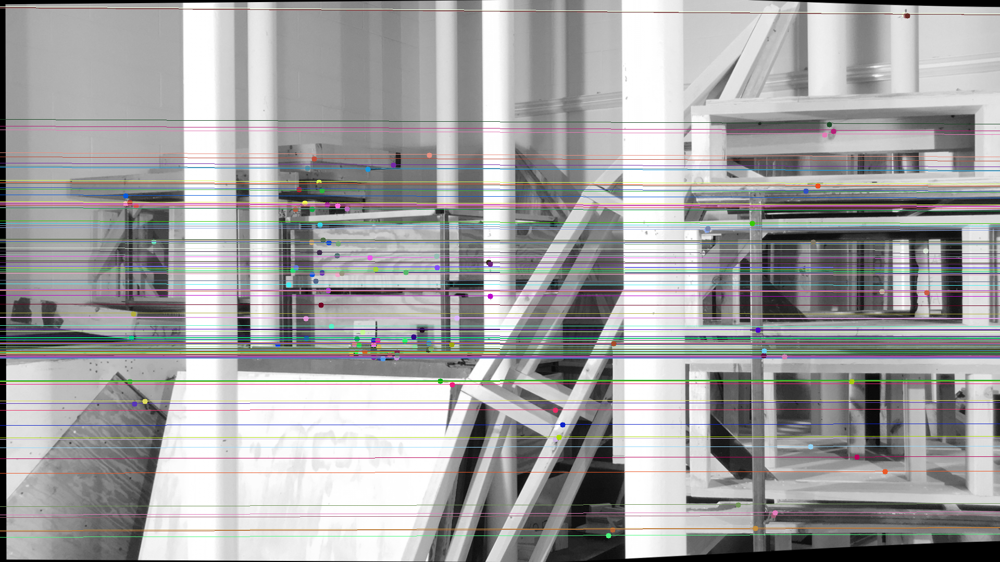

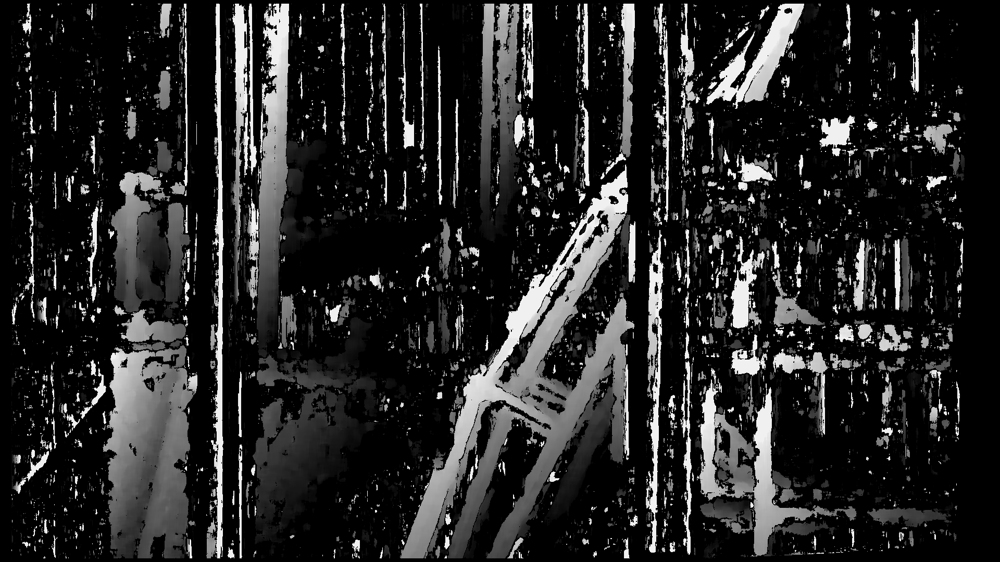

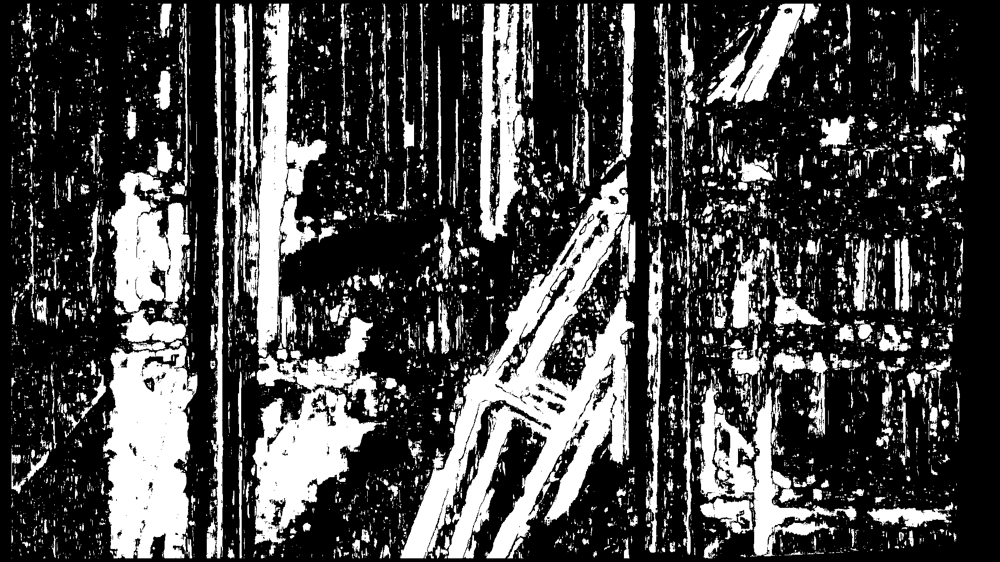

In [26]:
# Importing necessary libraries
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Function to perform feature matching between two images using SIFT
def feature_matching(image1, image2):
    # Create SIFT detector
    detector = cv2.SIFT_create()
    # Detect keypoints and compute descriptors for each image
    keypoints1, descriptors1 = detector.detectAndCompute(image1, None)
    keypoints2, descriptors2 = detector.detectAndCompute(image2, None)
    # Match descriptors between the two images
    matcher = cv2.FlannBasedMatcher_create()
    matches = matcher.knnMatch(descriptors1, descriptors2, k=2)

    # Filter good matches using ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.25 * n.distance:
            good_matches.append(m)

    # Extract source and destination points from good matches
    src_pts = np.float32([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    return src_pts, dst_pts

# Function to estimate the Fundamental matrix using RANSAC
def estimate_F(src_pts, dst_pts):
    F, mask = cv2.findFundamentalMat(src_pts, dst_pts, cv2.FM_RANSAC, 0.1, 0.99)
    return F

# Function to compute the Essential matrix from the Fundamental matrix and calibration matrices
def compute_E(F, K1, K2):
    E = np.dot(np.dot(K2.T, F), K1)
    return E

# Function to decompose the Essential matrix into rotation and translation matrices
def decompose_E(E, src_pts, dst_pts):
    _, R, t, _ = cv2.recoverPose(E, src_pts, dst_pts)
    return R, t

# Function to rectify images to ensure horizontal epipolar lines
def rectify_images(image1, image2, src_pts, dst_pts, K1, K2, F):
    _, H1, H2 = cv2.stereoRectifyUncalibrated(src_pts, dst_pts, F, (width, height))
    print("Homography Matrix H1:")
    print(H1)
    print("Homography Matrix H2:")
    print(H2)
    # Rectify the images using computed homography matrices
    image1_rectified = cv2.warpPerspective(image1, H1, (width, height))
    image2_rectified = cv2.warpPerspective(image2, H2, (width, height))
    return image1_rectified, image2_rectified, H1, H2

# Function to update calibration matrices for rectified images
def update_calibration_matrices(K1, K2, H1, H2):
    K1_rectified = np.dot(np.linalg.inv(H1), K1)
    K2_rectified = np.dot(np.linalg.inv(H2), K2)
    return K1_rectified, K2_rectified


# Function to update feature points after rectification
def update_feature_points(src_pts, dst_pts, H1, H2):
    src_pts_rectified = cv2.perspectiveTransform(src_pts, H1)
    dst_pts_rectified = cv2.perspectiveTransform(dst_pts, H2)
    return src_pts_rectified, dst_pts_rectified

# Function to decompose Essential matrix using rectified points
def decompose_E_rectified(E, src_pts_rectified, dst_pts_rectified):
    _, R, t, _ = cv2.recoverPose(E, src_pts_rectified, dst_pts_rectified)
    return R, t

# Function to visualize epipolar lines and feature points on rectified images
def visualize_epipolar_lines(image1_rectified, image2_rectified, src_pts_rectified, dst_pts_rectified, width):
    # Convert rectified images to color for visualization
    image1_with_points = cv2.cvtColor(image1_rectified, cv2.COLOR_GRAY2BGR)
    image2_with_points = cv2.cvtColor(image2_rectified, cv2.COLOR_GRAY2BGR)

    # Draw circles on feature points and epipolar lines on images
    for pt in src_pts_rectified:
        pt_int = (int(pt[0][0]), int(pt[0][1]))  # Convert to integer format
        cv2.circle(image1_with_points, pt_int, 5, (0, 255, 0), -1)
    for pt in dst_pts_rectified:
        pt_int = (int(pt[0][0]), int(pt[0][1]))  # Convert to integer format
        cv2.circle(image2_with_points, pt_int, 5, (0, 255, 0), -1)

    lines2 = cv2.computeCorrespondEpilines(dst_pts_rectified.reshape(-1, 1, 2), 2, F)
    lines2 = lines2.reshape(-1, 3)
    for r, pt1, pt2 in zip(lines2, src_pts_rectified, dst_pts_rectified):
        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = map(int, [0, -r[2] / r[1]])
        x1, y1 = map(int, [width, -(r[2] + r[0] * width) / r[1]])
        image1_with_points = cv2.line(image1_with_points, (x0, y0), (x1, y1), color, 1)
        image1_with_points = cv2.circle(image1_with_points, (int(pt1[0][0]), int(pt1[0][1])), 5, color, -1)
        image2_with_points = cv2.line(image2_with_points, (x0, y0), (x1, y1), color, 1)
        image2_with_points = cv2.circle(image2_with_points, (int(pt2[0][0]), int(pt2[0][1])), 5, color, -1)

    return image1_with_points, image2_with_points

# Load images (dataset1)
image1 = cv2.imread('Dataset/traproom/im0.png', 0)
image2 = cv2.imread('Dataset/traproom/im1.png', 0)

#calibration parameters for first dataset, the parameters are different for different datasets.
focal_length = 1769.02
principal_point = (1271.89,527.17)
baseline = 295.44
width = 1920
height = 1080
ndisp=140
vmin=25
vmax=118

# Define calibration matrices
K1 = np.array([[focal_length, 0, principal_point[0]],
               [0, focal_length, principal_point[1]],
               [0, 0, 1]])

K2 = np.array([[focal_length, 0, principal_point[0]],
               [0, focal_length, principal_point[1]],
               [0, 0, 1]])

# Perform feature matching between the images
src_pts, dst_pts = feature_matching(image1, image2)

# Estimate the Fundamental matrix
F = estimate_F(src_pts, dst_pts)

# Compute the Essential matrix
E = compute_E(F, K1, K2)

# Decompose the Essential matrix into rotation and translation matrices
R, t = decompose_E(E, src_pts, dst_pts)

# Rectify the images
image1_rectified, image2_rectified, H1, H2 = rectify_images(image1, image2, src_pts, dst_pts, K1, K2, F)

# Update calibration matrices for rectified images
K1_rectified, K2_rectified = update_calibration_matrices(K1, K2, H1, H2)

# Update feature points after rectification
src_pts_rectified, dst_pts_rectified = update_feature_points(src_pts, dst_pts, H1, H2)

# Decompose Essential matrix using rectified points
R_rectified, t_rectified = decompose_E_rectified(E, src_pts_rectified, dst_pts_rectified)

# Visualize epipolar lines and feature points on rectified images
image1_with_points, image2_with_points = visualize_epipolar_lines(image1_rectified, image2_rectified, src_pts_rectified, dst_pts_rectified, width)


# Specify the directory to save the all the images
save_dir = 'Dataset/Stereo_Vision_System'

# Save images with epipolar lines
cv2.imwrite(save_dir + 'image1_epilines_traproom.png', image1_with_points)
cv2.imwrite(save_dir + 'image2_epilines_traproom.png', image2_with_points)

# Display images
cv2_imshow(image1_with_points)
cv2_imshow(image2_with_points)

# Step 11: Calculate the disparity map
def calculate_disparity_map(image1_rectified, image2_rectified):
    stereo = cv2.StereoBM_create(numDisparities=16, blockSize=15)
    disparity = stereo.compute(image1_rectified, image2_rectified)
    return disparity

# Step 12: Rescale the disparity map and save it as grayscale and color images
def save_disparity_map(disparity_map, filename):
    disparity_map_rescaled = cv2.normalize(disparity_map, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    cv2.imwrite(save_dir + filename + "_grayscale_traproom.png", disparity_map_rescaled)
    heatmap = cv2.applyColorMap(disparity_map_rescaled, cv2.COLORMAP_JET)
    cv2.imwrite(save_dir + filename + "_color_traproom.png", heatmap)

# Step 13: Call functions to calculate and save the disparity map
disparity_map = calculate_disparity_map(image1_rectified, image2_rectified)
save_disparity_map(disparity_map, "disparity_map")

# Step 14: Compute depth values from the disparity map
def compute_depth_map(disparity_map, baseline, focal_length):
    depth_map = np.zeros_like(disparity_map, dtype=np.float32)
    depth_map[disparity_map != 0] = baseline * focal_length / disparity_map[disparity_map != 0]
    return depth_map

# Step 15: Generate depth image and save it as grayscale and color images
def save_depth_map(depth_map, filename):
    depth_map_rescaled = cv2.normalize(depth_map, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    cv2.imwrite(save_dir +filename + "_depth_grayscale_traproom.png", depth_map_rescaled)
    heatmap = cv2.applyColorMap(depth_map_rescaled, cv2.COLORMAP_JET)
    cv2.imwrite(save_dir + filename + "_depth_color_traproom.png", heatmap)

# Step 16: Call functions to compute and save the depth map
depth_map = compute_depth_map(disparity_map, baseline, focal_length)
save_depth_map(depth_map, "depth_map")


cv2_imshow(disparity_map)
cv2_imshow(depth_map)
